In [1]:
%matplotlib notebook

In [2]:
import numpy as np
import matplotlib.pyplot as mpl

In [3]:
import pymage
from pymage import query

In [4]:
import astrobject

In [5]:
from astrobject import instruments

In [6]:
from astropy import units

In [7]:
#
#qsdss = query.SDSSQuery()
#qsdss.download_target_metadata("ZTF18abmxahs",257.546516, +21.649036)
#qsdss.get_target_data(target.name, filters=["i", "g"])

In [8]:
target = astrobject.get_target("ZTF18abmxahs" , zcmb=None, ra=257.546516, dec=+21.649036)
gfile = '/Users/mrigault/Data/SDSS//frame-i-003185-1-0151.fits.bz2' #qsdss.get_target_data(target.name, filters=["g"])[0]
sg = instruments.get_instrument(gfile)
sg.set_target(target)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [9]:
#sg.show(vmax="99.9")

In [10]:
import pysedm
from pysedm.fluxcalibration import load_fluxcal_spectrum

# Cube
cube = pysedm.get_sedmcube( pysedm.io.get_night_files("20180818", "cube", "06_")[0])

# FluxCal
fluxcal = load_fluxcal_spectrum( pysedm.io.fetch_nearest_fluxcal("20180818", cube.filename) )
cube.scale_by( fluxcal.get_inversed_sensitivity(cube.header.get("AIRMASS", 1.1) ))


# Spec
spec = pysedm.sedm.load_sedmspec( pysedm.io.get_night_files("20180818", "spec", "06_", extention=".txt")[0])

cube.load_adr()
xref, yref = [-1.77, -3.01]#float(spec.header.get("XPOS")),float(spec.header.get("YPOS"))
cube.adr.set(airmass=float(spec.header.get("PSFADRZ")), lbdaref=float(spec.header.get("LBDAPOS")), 
             parangle=float(spec.header.get("PSFADRPA")))

In [11]:
#cube.show(interactive=True, vmax="99")

In [12]:
from galifu import photoslicer

imgsl = photoslicer.ImageSlicer( sg )

imgsl.set_cube(cube, 
               target_loc = cube.adr.refract(xref, yref, imgsl.instrument.lbda), 
               setup_slices=True, correct_for_rotation=True, 
               spaxel_in_arcsec=0.55)

In [13]:
cube.adr.refract(xref, yref, imgsl.instrument.lbda)

array([-1.68351578, -3.04311258])

In [14]:
imgsl.fillup_slices()

<IPython.core.display.Javascript object>


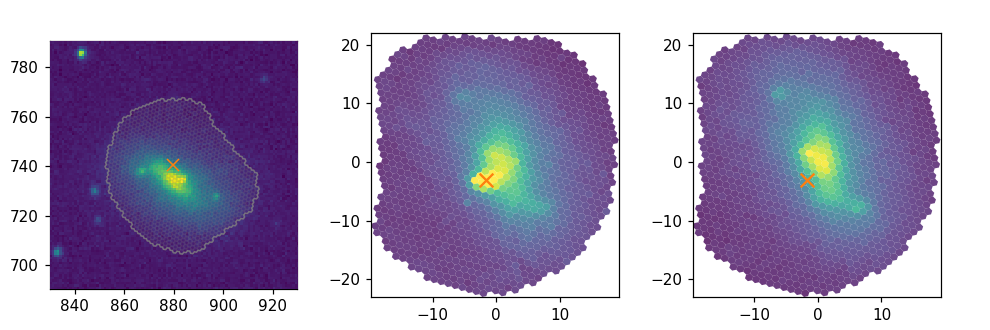

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.1-py3.6.egg/pyifu/spectroscopy.py:1439: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


In [15]:
imgsl.show()

<IPython.core.display.Javascript object>


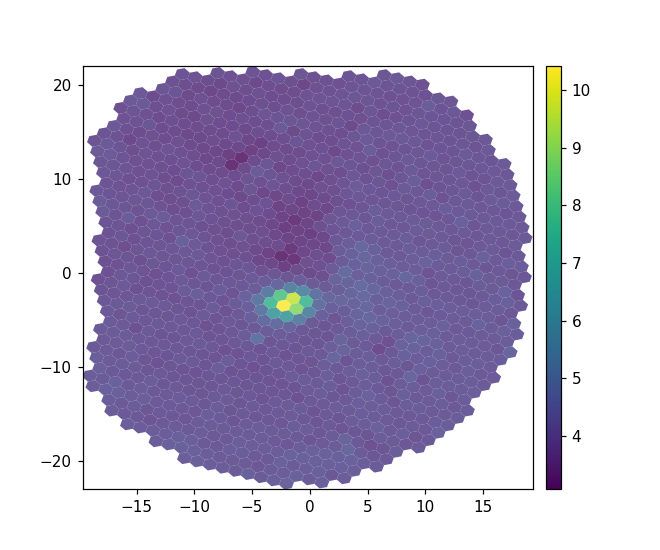

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.1-py3.6.egg/pyifu/spectroscopy.py:1439: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colorbar.py:218: UserWarning: Use the colorbar set_ticks() method instead.
  warnings.warn("Use the colorbar set_ticks() method instead.")


In [16]:
imgsl.residual_slice.show()

<IPython.core.display.Javascript object>


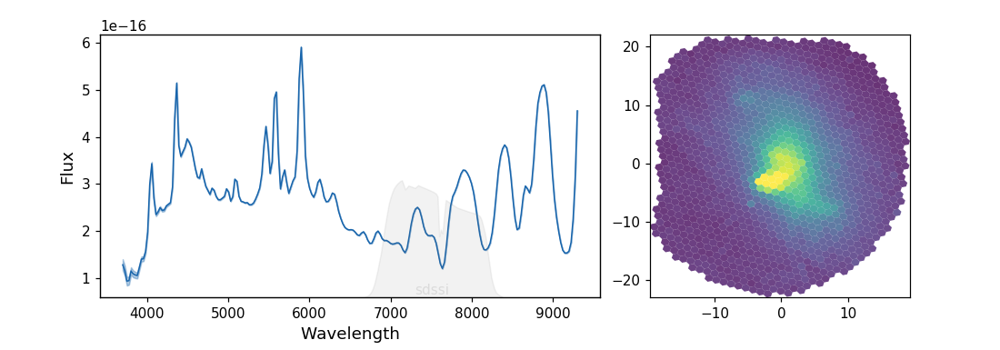

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.1-py3.6.egg/pyifu/spectroscopy.py:1439: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


{'ax': [<matplotlib.axes._axes.Axes at 0x11e340f28>,
 'fig': <matplotlib.figure.Figure at 0x11e2f3390>}

In [16]:
imgsl.show_cube(filter_color="0.5", cmap="viridis")

True

In [17]:
mslice = photoslicer.MultiSlicer()

In [18]:
mslice.set_cube(cube)
xref, yref = [-1.77, -3.01]#float(spec.header.get("XPOS")),float(spec.header.get("YPOS"))
mslice.set_adr(cube.adr, xref, yref)

In [19]:
gfile = '/Users/mrigault/Data/SDSS//frame-i-003185-1-0151.fits.bz2' #qsdss.get_target_data(target.name, filters=["g"])[0]
mslice.add_instrument( instruments.get_instrument(gfile, target) ) 
mslice.add_instrument( instruments.get_instrument(gfile.replace("-i-","-g-"), target) ) 
mslice.add_instrument( instruments.get_instrument(gfile.replace("-i-","-r-"), target) ) 
mslice.add_instrument( instruments.get_instrument(gfile.replace("-i-","-u-"), target) ) 
mslice.add_instrument( instruments.get_instrument(gfile.replace("-i-","-z-"), target) ) 

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [20]:
mslice.get_spaxel_photometry(450)

array([3.81908806e-18, 6.17463347e-18, 5.10201682e-18, 6.33596570e-18,
       3.02315043e-18])

<IPython.core.display.Javascript object>


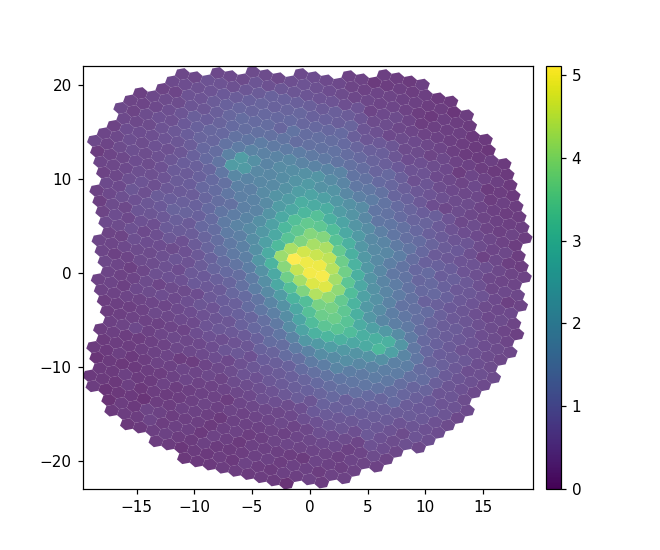

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.1-py3.6.egg/pyifu/spectroscopy.py:1439: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colorbar.py:218: UserWarning: Use the colorbar set_ticks() method instead.
  warnings.warn("Use the colorbar set_ticks() method instead.")


In [30]:
imgsl.spaxel_slice.show()

<IPython.core.display.Javascript object>


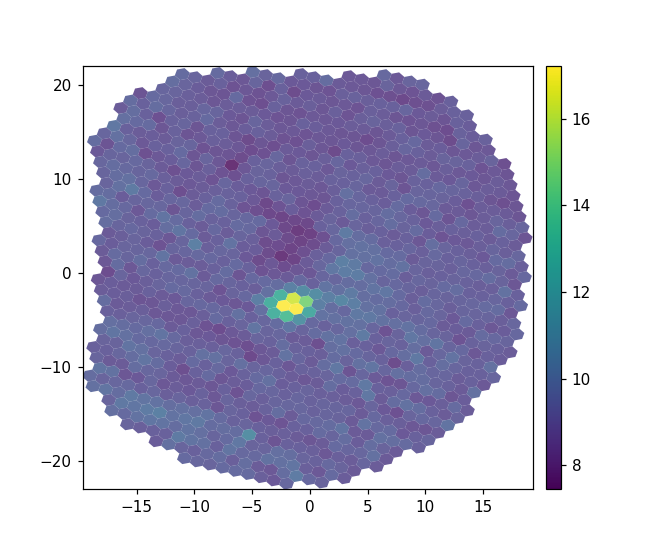

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.1-py3.6.egg/pyifu/spectroscopy.py:1439: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colorbar.py:218: UserWarning: Use the colorbar set_ticks() method instead.
  warnings.warn("Use the colorbar set_ticks() method instead.")


In [29]:
mslice.imageslicer["sdssz"].residual_slice.show()

<IPython.core.display.Javascript object>


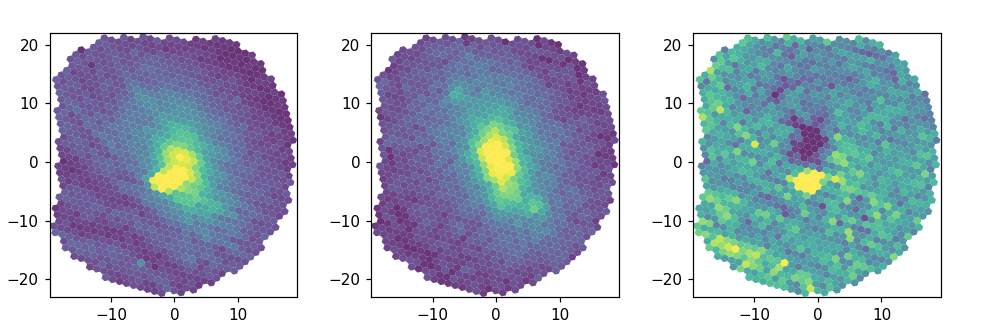

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.1-py3.6.egg/pyifu/spectroscopy.py:1439: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


In [79]:
mslice.alignslicer["sdssz"].show()

<IPython.core.display.Javascript object>


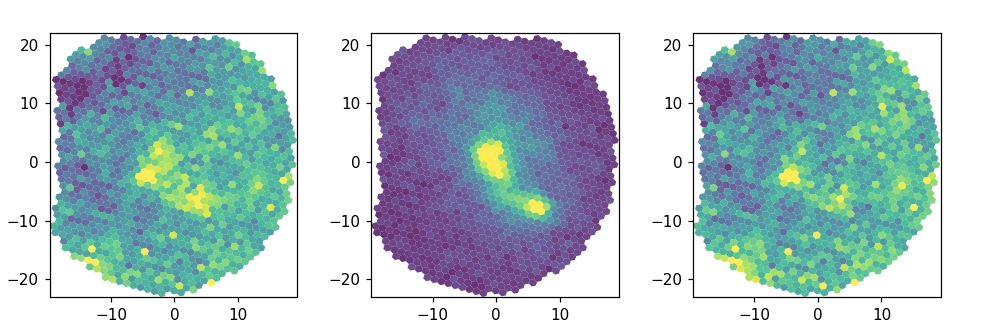

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.1-py3.6.egg/pyifu/spectroscopy.py:1439: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


In [80]:
mslice.alignslicer["sdssu"].show()

<IPython.core.display.Javascript object>


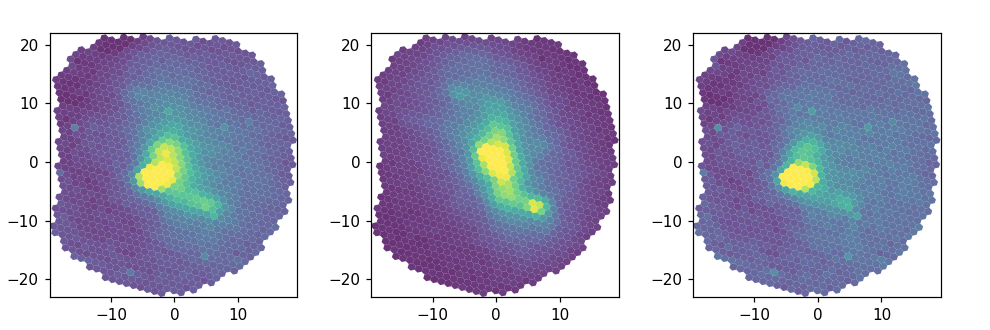

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.1-py3.6.egg/pyifu/spectroscopy.py:1439: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


In [81]:
mslice.alignslicer["sdssg"].show()

In [84]:
ssg = mslice.imageslicer["sdssg"]

In [101]:
ssg.spaxel_slice.spaxel_mapping

{20: [-4.935270967636979, 21.37700712937461],
 22: [6.432177503900212, 21.038704631186775],
 23: [-0.7780396049361964, 21.15170570836193],
 24: [-7.988256713772605, 21.264706785537083],
 26: [3.379191757764586, 20.926404287349254],
 27: [-11.041242459908231, 21.15240644169956],
 28: [-3.8310253510718226, 21.039405364524406],
 30: [7.536423120465367, 20.701102866336576],
 32: [0.3262060116289591, 20.814103943511725],
 33: [-6.884011097207449, 20.92710502068688],
 35: [4.483437374329741, 20.588802522499048],
 36: [-9.936996843343074, 20.814804676849356],
 37: [-2.7267797345066667, 20.701803599674204],
 39: [8.640668737030524, 20.363501101486374],
 40: [1.430451628194115, 20.476502178661523],
 42: [-5.779765480642293, 20.589503255836675],
 44: [5.587682990894896, 20.25120075764885],
 45: [-1.6225341179415111, 20.364201834823998],
 46: [-8.83275122677792, 20.477202911999154],
 47: [9.744914353595679, 20.02589933663617],
 48: [2.534697244759271, 20.138900413811317],
 49: [-11.88573697291354

In [113]:
lbda,data = np.asarray([[mslice.get_instrument_bandpass(b_).wave_eff, 
                         mslice.imageslicer[b_].instrument.count_to_flux(mslice.imageslicer[b_].spaxel_slice.data[772])]
             for b_ in ["sdssu","sdssg","sdssr","sdssi","sdssz"]]).T

In [118]:
lbda, data*1e18

(array([3594.3253669 , 4717.59824992, 6186.79825452, 7506.20775332,
        8918.30148441]),
 array([4.68746805, 6.18484898, 5.50788484, 4.13867228, 3.26702984]))

In [104]:
from astrobject import photometry

4.687468051590644e-18

In [71]:
from pyifu import spectroscopy
class AlignImageSlicer( object ):
    """ """
    def __init__(self, imageslicer, align=False, no_shift=True):
        """ """
        self.imageslicer = imageslicer
        
        self.residualslice = spectroscopy.get_slice(np.ones(self.dataslice.nspaxels)*np.NaN, 
                                                    np.asarray(self.dataslice.index_to_xy(self.dataslice.indexes)), 
                                                    self.dataslice.spaxel_vertices,  
                                                    variance = self.dataslice.variance, 
                                                    indexes=self.dataslice.indexes)        
        self.backgroundslice = spectroscopy.get_slice(np.zeros(self.dataslice.nspaxels), 
                                                    np.asarray(self.dataslice.index_to_xy(self.dataslice.indexes)), 
                                                    self.dataslice.spaxel_vertices,  
                                                    variance = self.dataslice.variance, 
                                                    indexes=self.dataslice.indexes)        
        if align:
            self.align(no_shift=no_shift)
        
    def update(self, 
               target_loc=None, cube_rotation=None, 
               spaxel_in_arcsec=None, amplitude=None,
               background=None, use_subpixelization=True,
               update_residual=True):
        """ """
        # Galaxy Update
        _update_gal_ = False
        if target_loc is not None or \
            cube_rotation is not None or\
            spaxel_in_arcsec is not None:
            _update_gal_=True
            # Means we need to re-derive the model_cube structure
            # - 1 Update the properties
            self.imageslicer._set_cube_prop_(target_loc=target_loc, 
                                             spaxel_in_arcsec=spaxel_in_arcsec, 
                                             cube_rotation=cube_rotation)
            # - 2 Re-derive the spaxel loc on the image
            self.imageslicer.setup_slices()
            # - 3 Measure the photometry in the spaxels (slowest part)
            self.imageslicer.fillup_slices(use_subpixelization=use_subpixelization)
            
        if amplitude is not None:
            _update_gal_=True
            self.modelslice.scale_by(1/amplitude)
            
        # Background Update
        if background is not None:
            _update_gal_ = True
            self.backgroundslice.set_data( np.ones(self.backgroundslice.nspaxels)*background )
            
        if _update_gal_ and update_residual:
            self.measure_residual()
            
    def measure_residual(self, **kwargs):
        """ """
        if kwargs != {}:
            self.update(update_residual=False, **kwargs)
            
        resdata = self.dataslice.data - (self.modelslice.data + self.backgroundslice.data)
        if self.dataslice.has_variance() and self.modelslice.has_variance():
            resvar = self.dataslice.variance + self.modelslice.variance
        else:
            resvar = None

        self.residualslice.set_data(resdata, variance=resvar)
        
    def align(self, no_shift=True):
        """ """
        from scipy.optimize import minimize
        def _chi2_( parameters ):
            """ """
            if len(parameters)==2:
                amplitude, background = parameters
                target_loc,cube_rotation,spaxel_in_arcsec = None, None, None
            else:
                amplitude, background, target_loc_x,target_loc_y,cube_rotation,spaxel_in_arcsec = parameters
                target_loc = [target_loc_x,target_loc_y]
                
            self.measure_residual(amplitude=amplitude,  background=background,
                                  target_loc=target_loc,
                                  cube_rotation=cube_rotation,
                                 spaxel_in_arcsec=spaxel_in_arcsec)
            chi2 =np.nansum(self.residualslice.data**2 / self.residualslice.variance )
            return chi2
        
        return minimize(_chi2_, self.get_guesses(no_shift) )
        
    def get_guesses(self, no_shift=False):
        """ """
        ampl, bkgd  = self.get_guessed_amplitude_and_background()
        if no_shift:
            return ampl, bkgd
        target_loc_x,target_loc_y  = self.imageslicer._cube_target_loc
        rotation    = self.imageslicer._cube_rotation
        spaxel_size = self.imageslicer._cube_spaxel_arcsec
        return [ampl, bkgd, target_loc_x,target_loc_y,rotation,spaxel_size]
    
    def get_guessed_amplitude_and_background(self):
        """ """
        backgrounddata, bkgd_signaldata    = np.percentile(self.dataslice.data, [25,75])
        backgrounddmodel, bkgd_signalmodel = np.percentile(self.modelslice.data, [25,75])
        amplitude = (bkgd_signaldata-backgrounddata)/(bkgd_signalmodel-backgrounddmodel)
        return amplitude, backgrounddata
    
    
    def show(self):
        """ """
        import matplotlib.pyplot as mpl        
        fig     = mpl.figure(figsize=[9,3])
        axcube  = fig.add_axes([0.05,0.1,0.25,0.8])
        axmodel = fig.add_axes([0.375,0.1,0.25,0.8])
        axres   = fig.add_axes([0.7 ,0.1,0.25,0.8])
        
        prop = dict(vmax="99", vmin="1", show_colorbar=False)
        self.dataslice.show(ax=axcube,**prop)
        self.modelslice.show(ax=axmodel,**prop)
        self.residualslice.show(ax=axres,**prop)
        
    # ================ #
    #  Properties      #
    # ================ #
    @property
    def dataslice(self):
        """ """
        if not hasattr(self, "_dataslice"):
            self._dataslice = self.imageslicer.cube_slice.copy()
            self._datanorm  = self._dataslice.rawdata.mean()
            self._dataslice.scale_by(self._datanorm)
        return self.imageslicer.cube_slice
    
    @property
    def modelslice(self):
        """ """
        if not hasattr(self, "_modelslice"):
            self._modelslice = self.imageslicer.spaxel_slice.copy()
            self._modelnorm  = self._modelslice.rawdata.mean()
            self._modelslice.scale_by(self._modelnorm)
        return self._modelslice
    

In [108]:
pp = photometry.get_photopoint(lbda=lbda[0], flux=data[0], var=None, zp=mslice.imageslicer["sdssu"].instrument.mab0,
                         bandname="sdssu")

In [111]:
pp.mag

ValueError: set a value greater than 10! 0

In [106]:
ssg.instrument.mab0

22.5

In [115]:
data

array([4.68746805e-18, 6.18484898e-18, 5.50788484e-18, 4.13867228e-18,
       3.26702984e-18])

<IPython.core.display.Javascript object>


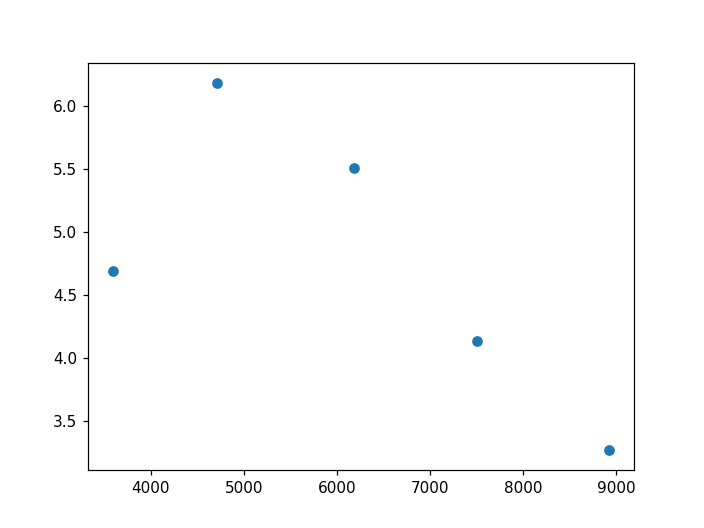

In [116]:
fig = mpl.figure()
ax = fig.add_subplot(111)
ax.scatter(lbda,data*1e18)

<IPython.core.display.Javascript object>


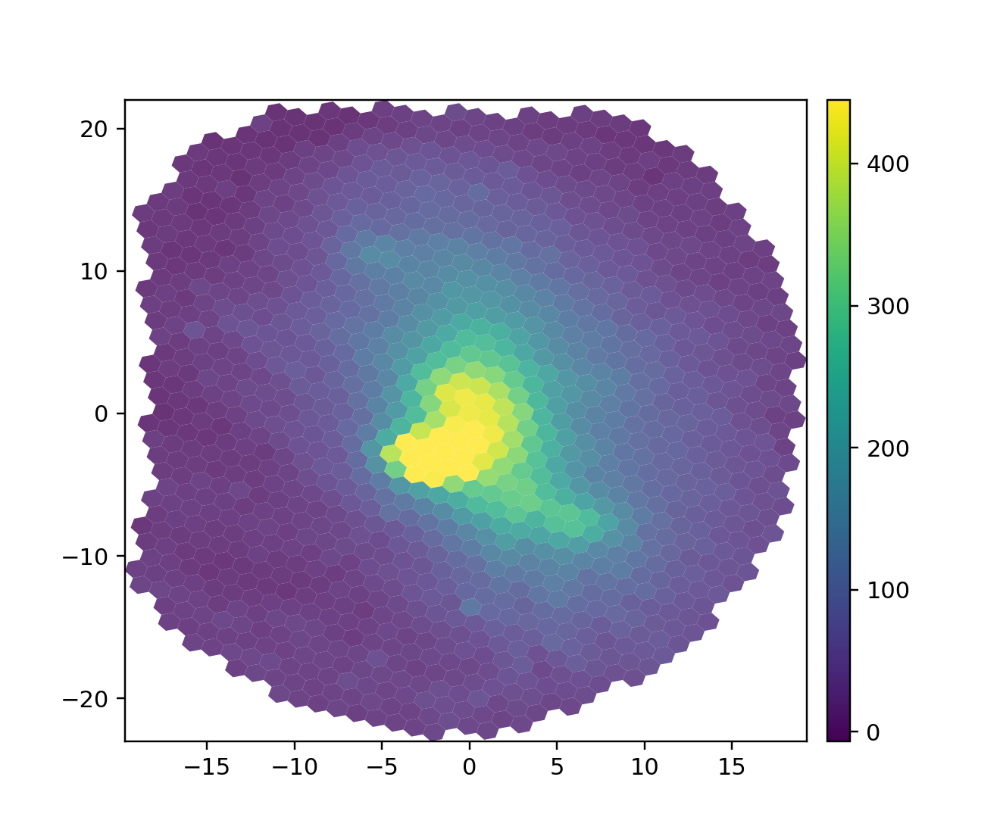

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.0-py3.6.egg/pyifu/spectroscopy.py:1438: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colorbar.py:218: UserWarning: Use the colorbar set_ticks() method instead.
  warnings.warn("Use the colorbar set_ticks() method instead.")


In [90]:
aimgsl.residualslice.show(vmin="1", vmax="99")

<IPython.core.display.Javascript object>


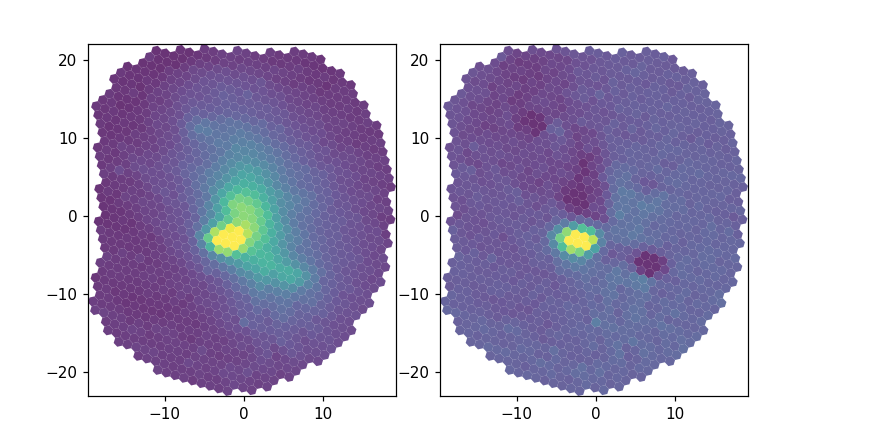

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.0-py3.6.egg/pyifu/spectroscopy.py:1438: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  linewidth = 1 if c_ == "None" and lw==0 else lw


In [41]:
fig = mpl.figure(figsize=[8,4])
axd  = fig.add_axes([0.1,0.1,0.35,0.8])
axr  = fig.add_axes([0.5,0.1,0.35,0.8])

aimgsl.dataslice.show(ax=axd, vmax="99.5", vmin="1", show_colorbar=False)
aimgsl.residualslice.show(ax=axr, vmax=400, vmin=-80, show_colorbar=False)

In [157]:
np.sum((aimgsl.residualslice.data)**2/aimgsl.residualslice.variance)

140700.2731907299

In [48]:
aimgsl.modelslice.scale_by(2)

<IPython.core.display.Javascript object>


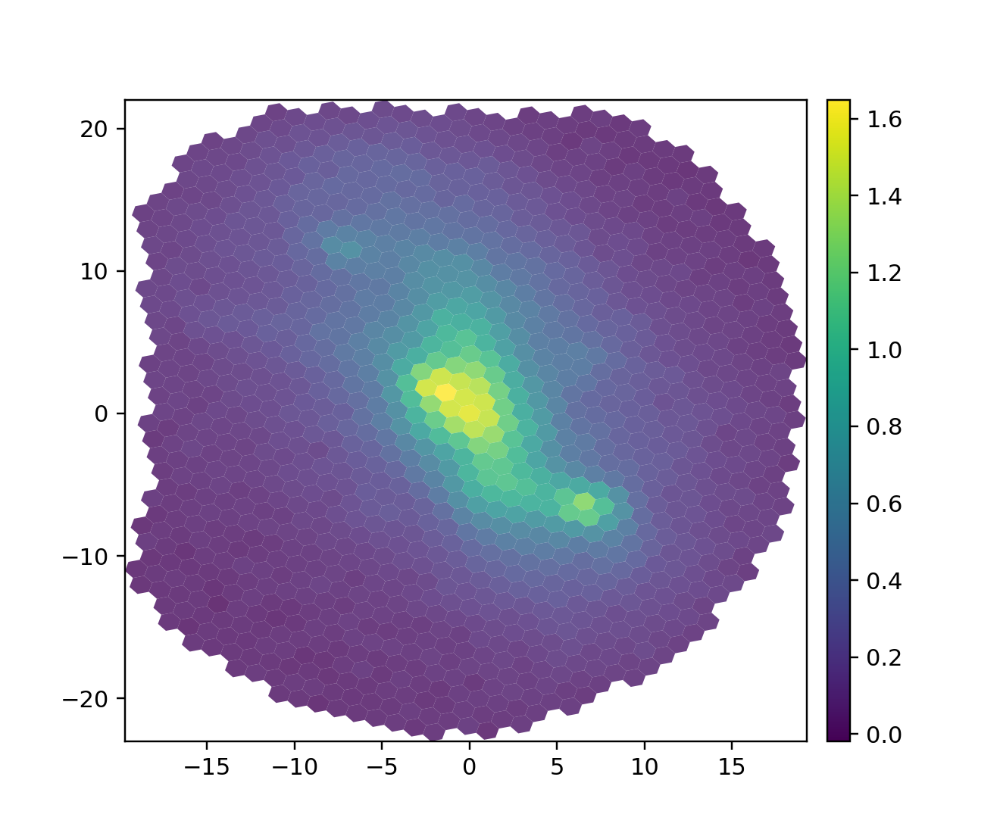

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.0-py3.6.egg/pyifu/spectroscopy.py:1438: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colorbar.py:218: UserWarning: Use the colorbar set_ticks() method instead.
  warnings.warn("Use the colorbar set_ticks() method instead.")


In [51]:
aimgsl.modelslice.show()

In [93]:
aimgsl.measure_residual(cube_rotation=-2/180*np.pi)


<IPython.core.display.Javascript object>


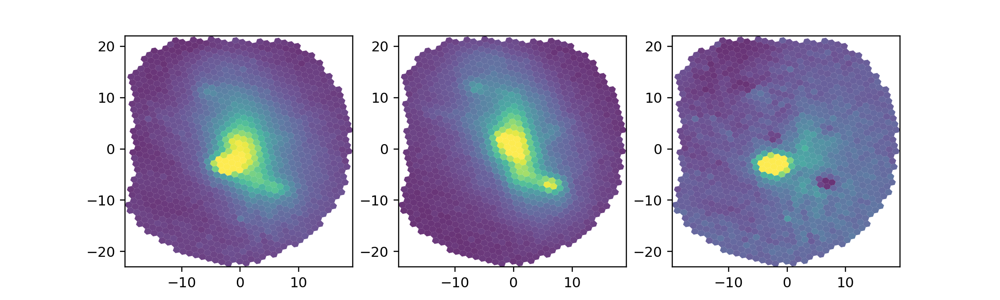

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.0-py3.6.egg/pyifu/spectroscopy.py:1438: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


In [94]:
aimgsl.measure_residual(amplitude=125)

fig = mpl.figure(figsize=[10,3])
axd  = fig.add_subplot(131)
axm  = fig.add_subplot(132)
axr  = fig.add_subplot(133)
prop = dict(vmin="1",#, np.percentile(aimgsl.dataslice.data, "2"), 
            vmax= "99",
            show_colorbar=False )
aimgsl.dataslice.show(ax=axd, **prop)
aimgsl.modelslice.show(ax=axm, **prop)
aimgsl.residualslice.show(ax=axr, **prop)

In [73]:
prop

{'show_colorbar': False, 'vmax': 825.9837159202082, 'vmin': 421.770841021028}

<IPython.core.display.Javascript object>


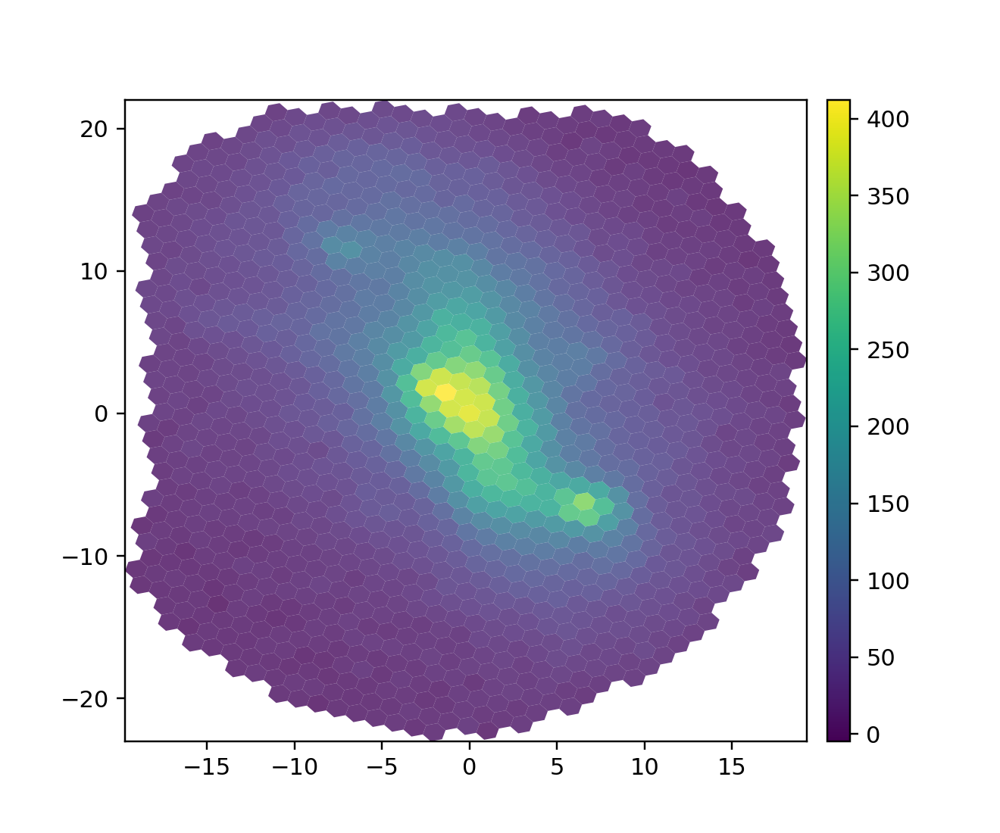

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.0-py3.6.egg/pyifu/spectroscopy.py:1438: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colorbar.py:218: UserWarning: Use the colorbar set_ticks() method instead.
  warnings.warn("Use the colorbar set_ticks() method instead.")


In [74]:
aimgsl.modelslice.show()

<IPython.core.display.Javascript object>


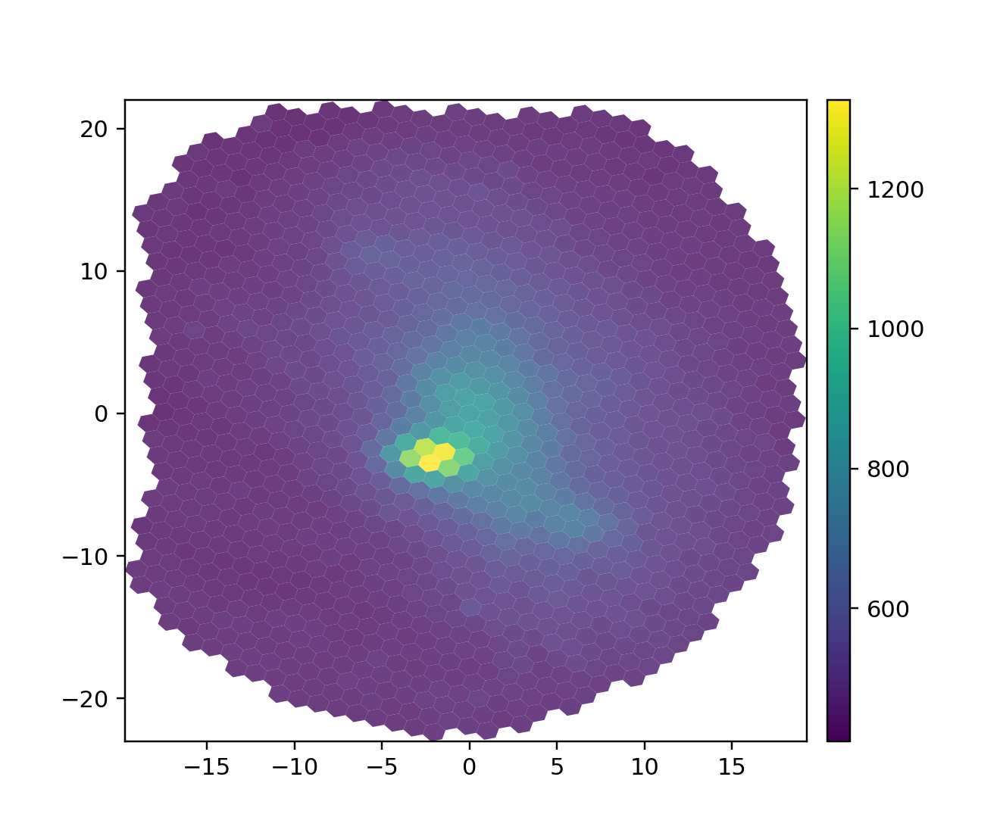

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.0-py3.6.egg/pyifu/spectroscopy.py:1438: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colorbar.py:218: UserWarning: Use the colorbar set_ticks() method instead.
  warnings.warn("Use the colorbar set_ticks() method instead.")


In [75]:
aimgsl.dataslice.data

<IPython.core.display.Javascript object>


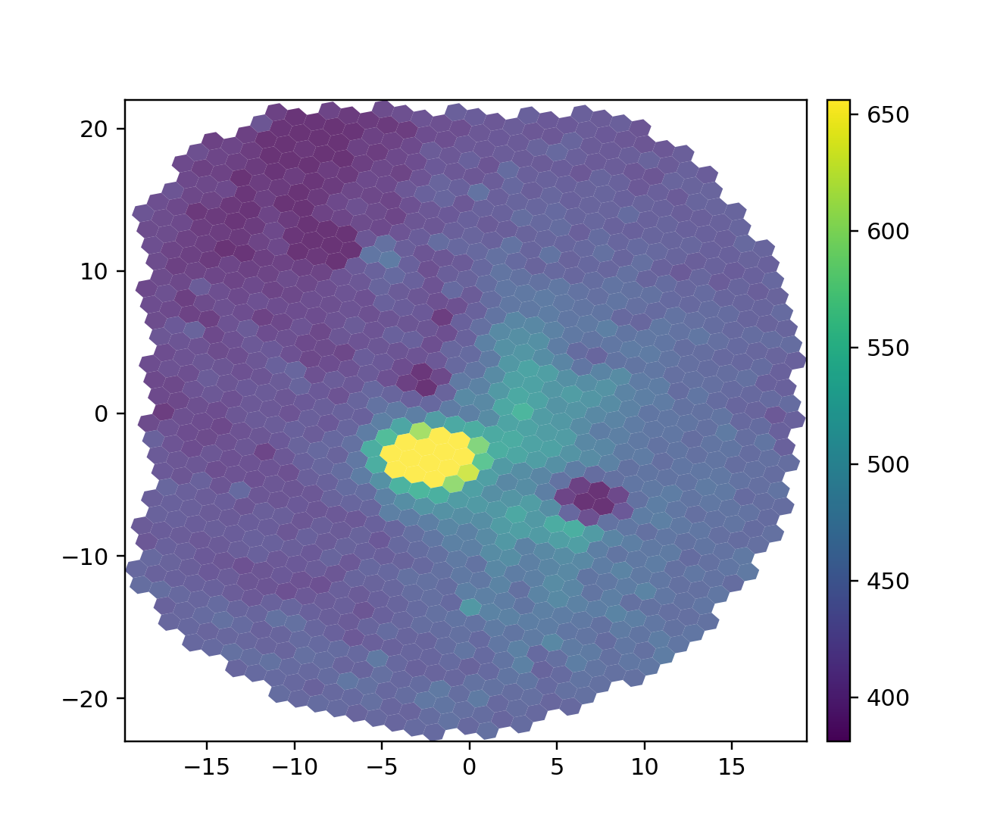

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.0-py3.6.egg/pyifu/spectroscopy.py:1438: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colorbar.py:218: UserWarning: Use the colorbar set_ticks() method instead.
  warnings.warn("Use the colorbar set_ticks() method instead.")


In [69]:

aimgsl.residualslice.show(vmin="2", vmax="99")

<IPython.core.display.Javascript object>


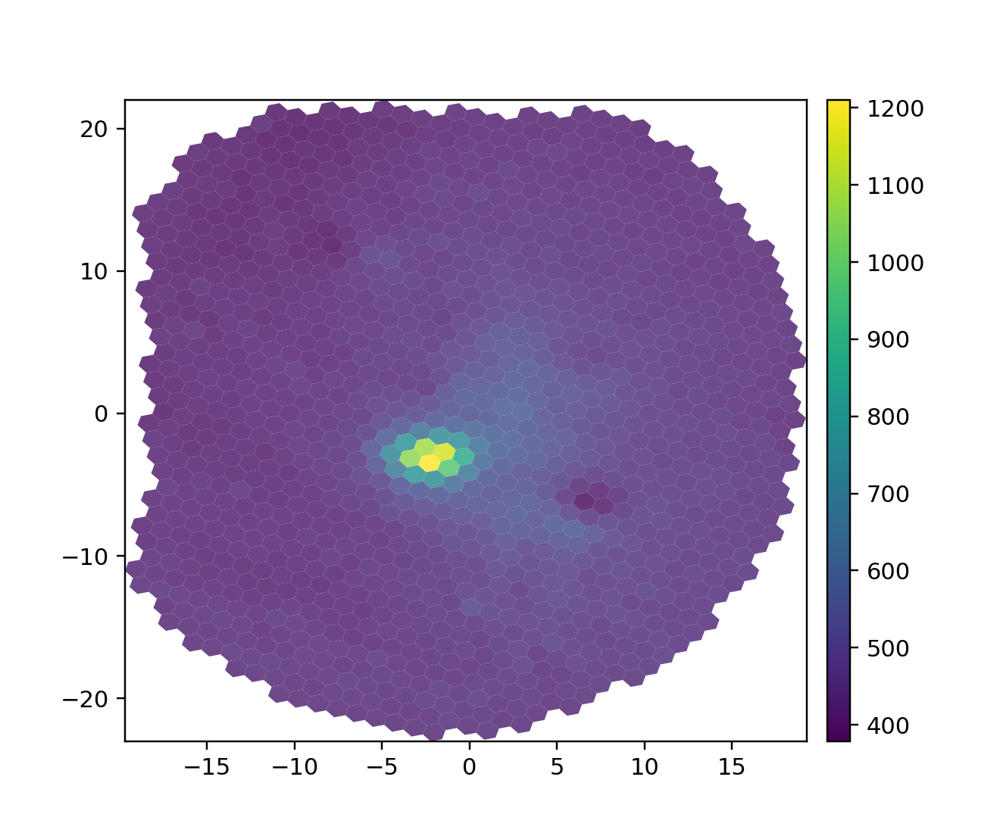

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.9.0-py3.6.egg/pyifu/spectroscopy.py:1438: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colorbar.py:218: UserWarning: Use the colorbar set_ticks() method instead.
  warnings.warn("Use the colorbar set_ticks() method instead.")


In [ ]:
aimgsl.measure_residual(amplitude=np.mean(aimgsl.residualslice.data))

In [25]:
aimgsl.measure_residual()

In [14]:
slf = imgsl.cube.get_slice(lbda_trans=[imgsl.instrument.bandpass.wave, imgsl.instrument.bandpass.trans], 
                           slice_object=True)

<IPython.core.display.Javascript object>


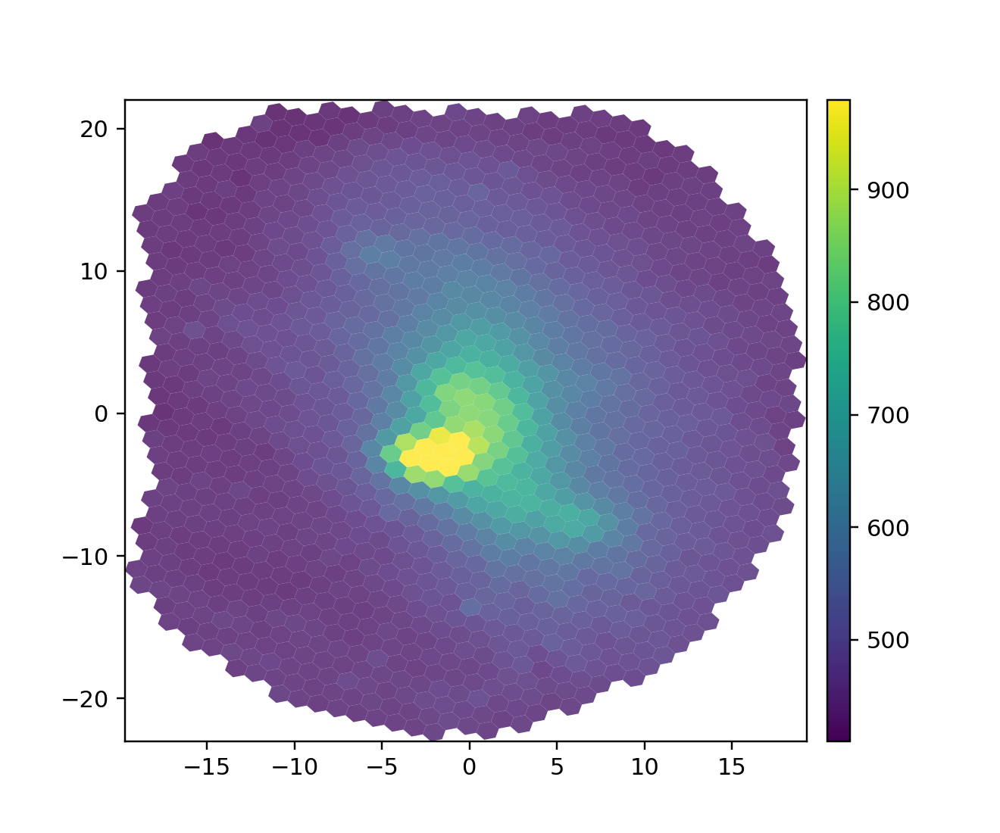

/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.8.1-py3.6.egg/pyifu/spectroscopy.py:1433: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colorbar.py:218: UserWarning: Use the colorbar set_ticks() method instead.
  warnings.warn("Use the colorbar set_ticks() method instead.")


In [18]:
slf.show(vmax="99.5")

In [29]:
def align(self):
    """ """
    

array([434.82064177, 437.34491901, 453.7456736 , ..., 442.60219429,
       447.11348415, 448.57260999])

In [ ]:
imgsl.setup_slices

In [17]:
axsdss, axsedm, axmodel = mpl.gcf().axes

In [27]:
from pyifu import spectroscopy

In [48]:
def get_slice(self, lbda, transmission, lbda_eff=None):
    """ """
    slice_data = [spectroscopy.synthesize_photometry(self.lbda, self.get_index_data(i), lbda, transmission)
            for i,j in enumerate(self.indexes)]
    slice_var  = [spectroscopy.synthesize_photometry(self.lbda, self.get_index_data(i, "variance"), lbda, transmission)
            for i,j in enumerate(self.indexes)]
    if lbda_eff is None:
        lbda_eff = np.average(lbda, weights=transmission)
    return spectroscopy.get_slice(slice_data, self.index_to_xy(self.indexes), spaxel_vertices=self.spaxel_vertices, 
                                 variance=slice_var, indexes=self.indexes, lbda=lbda_eff)

In [49]:
slt = get_slice(imgsl.cube, imgsl.instrument.bandpass.wave, imgsl.instrument.bandpass.trans)

In [50]:
imgsl.cube.indexes

array([  20,   22,   23, ..., 1594, 1596, 1600])

In [51]:
imgsl.cube.get_index_data

<bound method Cube.get_index_data of <pysedm.sedm.SEDMCube object at 0x11c753400>>

In [52]:
slt.lbda

4717.599777463945

In [53]:
imgsl.instrument.bandpass.wave_eff

4717.598249924572

In [21]:
axsdss.set_xlim(835,925)
axsdss.set_title("SDSS g-band", fontsize="medium")
axsedm.set_title("SEDM", fontsize="medium")
axmodel.set_title("SEDM-like SDSS g-band", fontsize="medium")

Text(0.5,1,'SEDM-like SDSS g-band')

In [16]:
verts = imgsl.pixel_slice.get_index_vertices(imgsl.pixel_slice.indexes)

In [18]:
data_, var_ = photoslicer.get_slice_photometry(imgsl.instrument.data, verts, variance = imgsl.instrument.var, ncore=4)

------ Multiprocessing -------
 1226 measurements to do 
 running on 4 (requested) cores 


In [21]:
imgsl.photo_polygon.get_photometry(verts)

(nan, nan)

In [19]:
data_

array([0.49660221, 0.19228585, 0.57599558, ..., 0.00198404, 0.07885902,
       0.00058808])

In [20]:
var_

array([0.00133942, 0.00104002, 0.00142081, ..., 0.00085069, 0.00092714,
       0.00082704])

In [19]:
np.shape(pixels)

(10, 16, 2)

In [19]:
(4*units.ms*1225).to("second")

<Quantity 4.9 s>

IllegalArgumentException: Points of LinearRing do not form a closed linestring
Shell is not a LinearRing


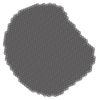

In [19]:
x,y = np.asarray(imgsl.slice.index_to_xy(imgsl.slice.indexes)).T

In [24]:
from shapely import geometry

In [20]:
geometry.Polygon(imgsl.spaxel_slice.spaxel_vertices).area

1.1547005383792515

In [21]:
imgsl.slice.set_data(data, variance=var )

<IPython.core.display.Javascript object>


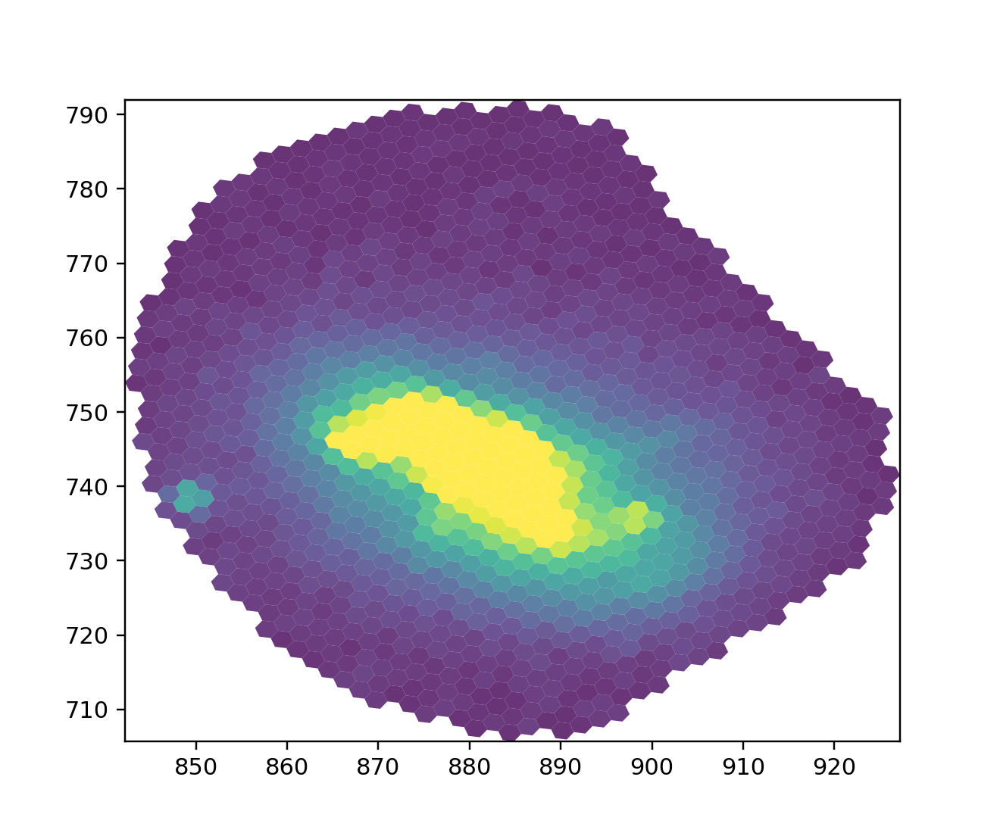

/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colors.py:489: RuntimeWarning: invalid value encountered in less
  np.copyto(xa, -1, where=xa < 0.0)
/Users/mrigault/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:23: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


In [39]:
fig = mpl.figure(figsize=[6,5])
ax  = fig.add_subplot(111)
from matplotlib import patches

kwargs = {}
empty_if_nan = True

toshow = "data"
self = imgsl.slice
value = np.asarray( eval("self.%s"%toshow) ) if toshow is not None else None
vmin = "5"
vmin = np.percentile(value[value==value],float(vmin))
vmax = "95"
vmax = np.percentile(value[value==value],float(vmax))
colors = mpl.cm.viridis((value-vmin)/(vmax-vmin))

lw  = 0
x,y = np.asarray(self.index_to_xy(self.indexes)).T

for i in range(self.nspaxels):
    c_ = "None" if (np.isnan(value[i]) and empty_if_nan) else colors[i] 
    linewidth = 1 if c_ == "None" and lw==0 else lw           
    ax.add_patch(patches.Polygon(self.spaxel_vertices+np.asarray([x[i],y[i]]),
                                facecolor=c_, alpha=0.8, linewidth=linewidth, edgecolor=edgecolor,
                                  **kwargs))
    
ax.autoscale(True, tight=True)

In [26]:
np.argwhere(np.isnan(self.data))

array([[791]])

<IPython.core.display.Javascript object>


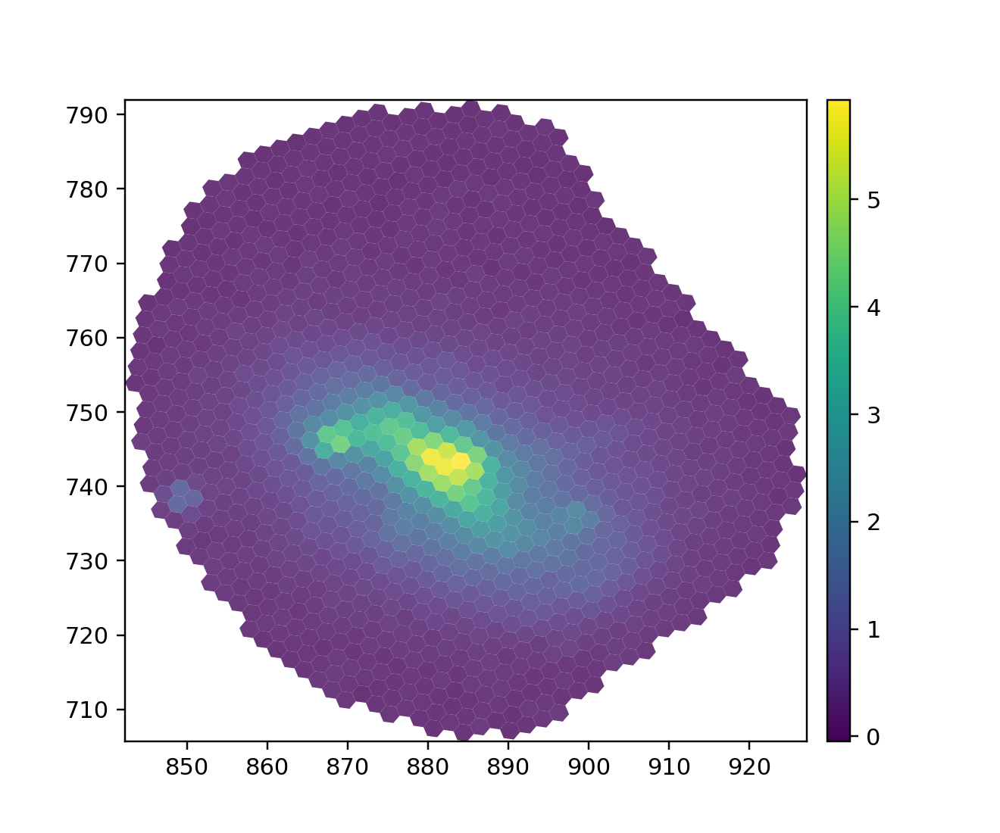

/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colors.py:489: RuntimeWarning: invalid value encountered in less
  np.copyto(xa, -1, where=xa < 0.0)
/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.8.0-py3.6.egg/pyifu/spectroscopy.py:1405: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  linewidth = 1 if c_ == "None" and lw==0 else lw
/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colorbar.py:218: UserWarning: Use the colorbar set_ticks() method instead.
  warnings.warn("Use the colorbar set_ticks() method instead.")


In [22]:
imgsl.slice.show(empty_if_nan=True)

<IPython.core.display.Javascript object>


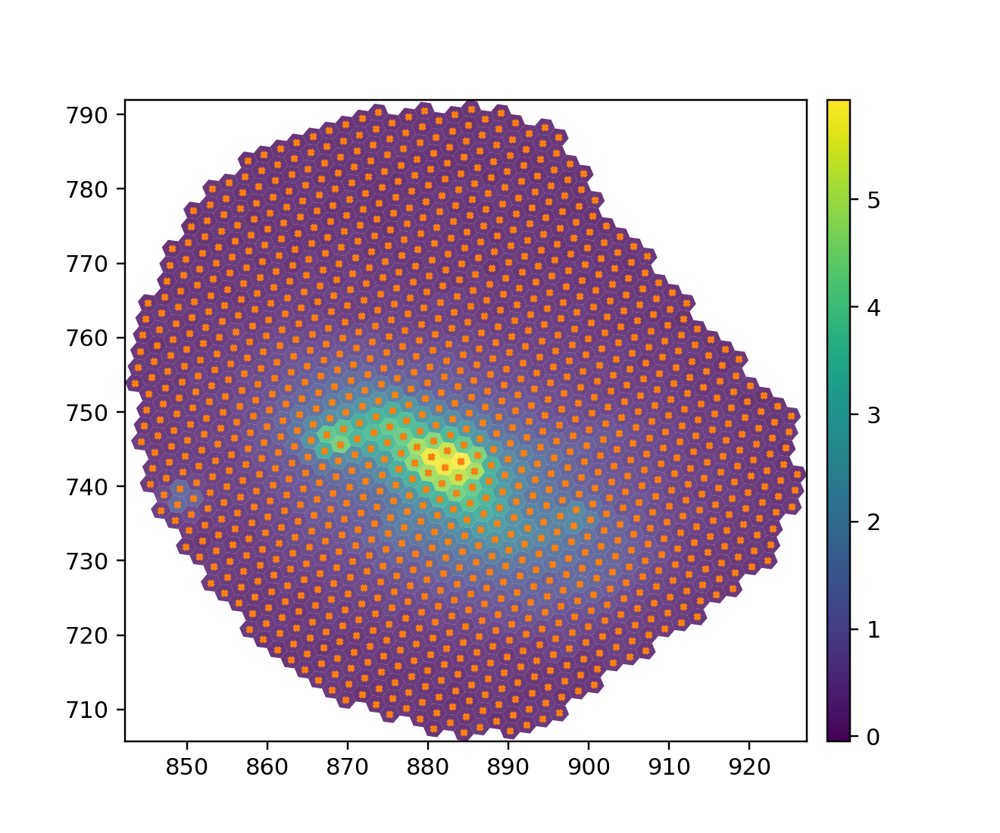

/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colors.py:489: RuntimeWarning: invalid value encountered in less
  np.copyto(xa, -1, where=xa < 0.0)
/Users/mrigault/anaconda3/lib/python3.6/site-packages/pyifu-0.8.0-py3.6.egg/pyifu/spectroscopy.py:1405: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colorbar.py:218: UserWarning: Use the colorbar set_ticks() method instead.
  warnings.warn("Use the colorbar set_ticks() method instead.")


In [58]:
imgsl.slice.show(empty_if_nan=False)
ax = mpl.gcf().axes[0]
ax.scatter(x,y, s=5, marker="x", color="0.5", zorder=8)
ax.scatter(x[data==data],y[data==data], s=5, marker="x", color="C1", zorder=8)
ax.scatter(x[data!=data],y[data!=data], s=5, marker="x", color="C2", zorder=8)

array([[   0],
       [   1],
       [   2],
       ...,
       [1223],
       [1224],
       [1225]])

In [31]:
value = imgsl.slice.data
colors = mpl.cm.viridis((value - np.nanmin(value))/(np.nanmax(value) - np.nanmin(value)))

/Users/mrigault/anaconda3/lib/python3.6/site-packages/matplotlib/colors.py:489: RuntimeWarning: invalid value encountered in less
  np.copyto(xa, -1, where=xa < 0.0)


In [30]:
colors[np.argwhere(value!=value)]

TypeError: only integer scalar arrays can be converted to a scalar index

In [23]:
spaxels_xy = np.asarray(cube.index_to_xy(cube.indexes))

In [25]:
cube.set_spaxel_vertices

array([[ -4.93527097,  21.37700713],
       [  6.4321775 ,  21.03870463],
       [ -0.7780396 ,  21.15170571],
       ...,
       [ -3.11944065, -22.05150993],
       [  1.03779071, -22.27681135],
       [ -2.01519504, -22.38911169]])

In [29]:
index= [30, 32]
(cube.spaxel_vertices + np.asarray( cube.index_to_xy(index) ))

ValueError: operands could not be broadcast together with shapes (6,2) (2,2) 

<IPython.core.display.Javascript object>


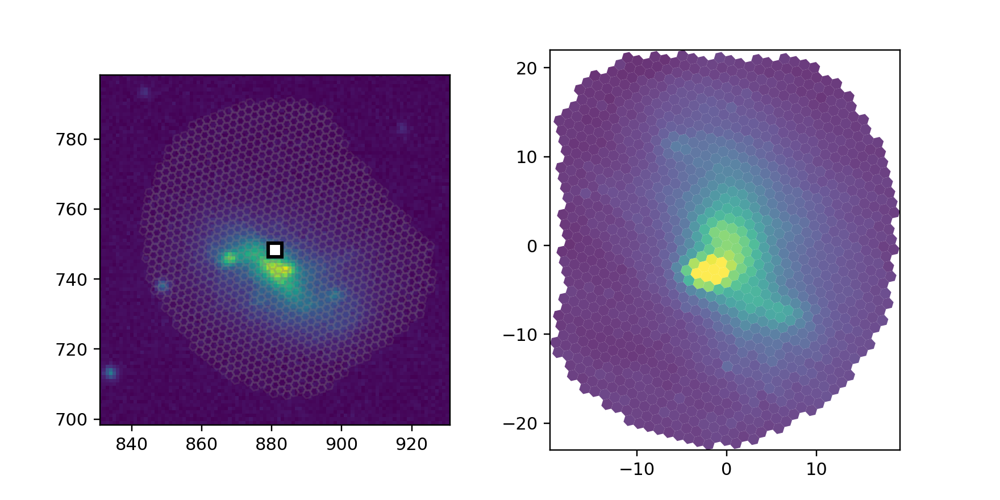

In [17]:
imgsl = ImageSlicer(sg)
imgsl.set_cube(cube, setup_pixel_slice=True, correct_for_rotation=True)
imgsl.show(slice_ec="0.5", slice_alpha=0.2, logscale=False, zoom=50,
           zoomon="target", cmap=mpl.cm.viridis, vmax="99.85", vmin="5")

<IPython.core.display.Javascript object>


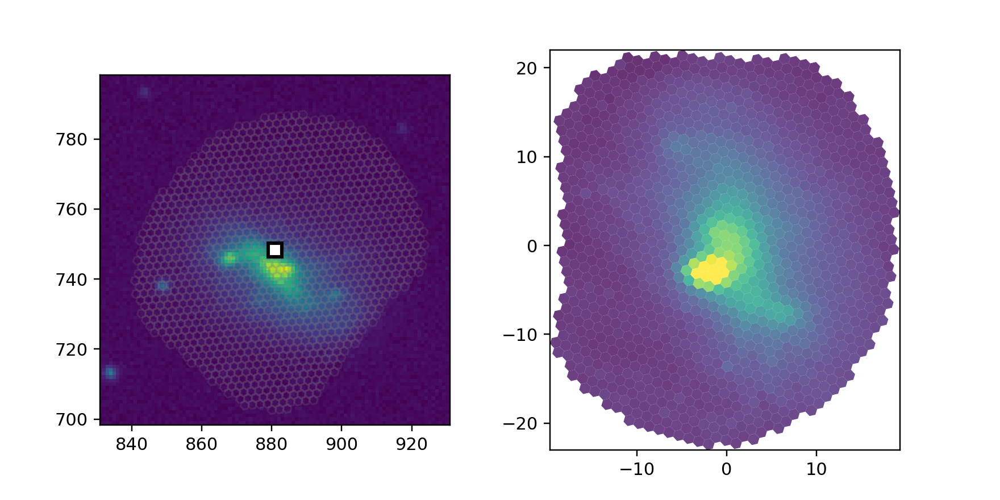

In [40]:
imgsl = ImageSlicer(sg)
imgsl.set_cube(cube, setup_pixel_slice=True, correct_for_rotation=True)
imgsl.show(slice_ec="0.5", slice_alpha=0.2, logscale=False, zoom=50,
           zoomon="target", cmap=mpl.cm.viridis, vmax="99.85", vmin="5")

<IPython.core.display.Javascript object>


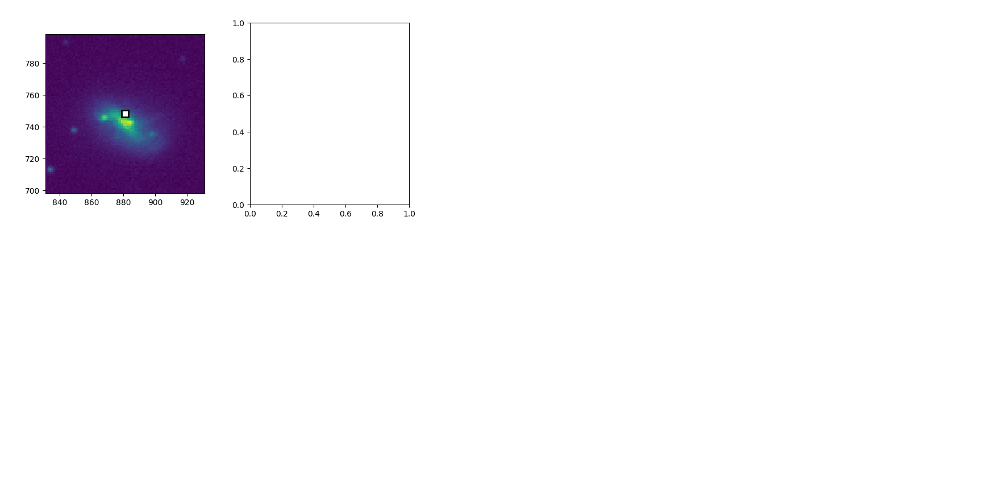

ValueError: operands could not be broadcast together with shapes (6,2) (2,1226) 

In [53]:
imgsl.slice.nspaxels

1226

<IPython.core.display.Javascript object>


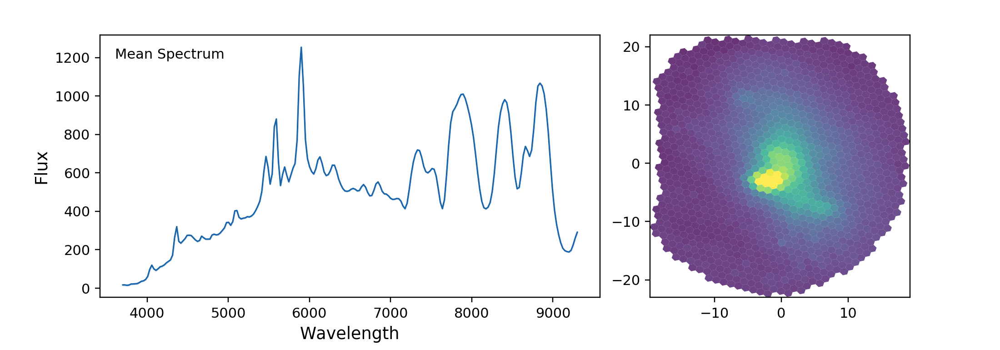

In [36]:
cube._display_im_

In [93]:
target.name

'ZTF18abmxahs'

In [78]:
sg.pixel_to_coords(0,0)

array([257.40999875,  21.652857  ])

In [95]:
sg.pixel_to_coords(0,0)-sg.pixel_to_coords(0,10000)

array([-0.73464862,  0.86057389])

In [97]:
10000* sg.pixel_size_arcsec.to("deg").value

1.0994976150281792

In [100]:
np.arccos(0.86057389/(10000* sg.pixel_size_arcsec.to("deg").value))*180/3.14

38.51131187723178

In [106]:
det = cd1_1 * cd2_2 - cd1_2 * cd2_1

<bound method WCS.det2im of WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 257.559423089  21.659218367  
CRPIX : 1025.0  745.0  
CD1_1 CD1_2  : 8.59293578984e-05  6.86069280493e-05  
CD2_1 CD2_2  : 6.85936987317e-05  -8.59714757055e-05  
NAXIS : 2048  1489>

In [120]:
det = np.linalg.det(sg.wcs.wcs.cd)

In [121]:
np.sign(det)

-1.0

In [129]:
#np.arctan2(np.sign(det) * cd1_2, sgn * cd1_1)
sign = np.sign(np.linalg.det(sg.wcs.wcs.cd))
np.arctan2(sign * sg.wcs.wcs.cd[0,1], sign * sg.wcs.wcs.cd[0,0])

-2.4678214825075284

In [123]:
#np.arctan2(-cd2_1, cd2_2)
np.arctan2(-sg.wcs.wcs.cd[1,0], sg.wcs.wcs.cd[1,1])


-2.4681544190230604

In [128]:
np.arctan2(-sg.wcs.wcs.cd[1,0], sg.wcs.wcs.cd[1,1])*180/np.pi

-141.41483139658507

In [127]:
sg.header

SIMPLE  =                    T /                                                
BITPIX  =                  -32 / 32 bit floating point                          
NAXIS   =                    2                                                  
NAXIS1  =                 2048                                                  
NAXIS2  =                 1489                                                  
EXTEND  =                    T /Extensions may be present                       
BZERO   =              0.00000 /Set by MRD_SCALE                                
BSCALE  =              1.00000 /Set by MRD_SCALE                                
TAI     =        4527647919.02 / 1st row - Number of seconds since Nov 17 1858  
RA      =            258.77783 / 1st row - Right ascension of telescope boresigh
DEC     =            21.750571 / 1st row - Declination of telescope boresight (d
SPA     =             141.863  / 1st row - Camera col position angle wrt north (
IPA     =             193.83

In [75]:
sg.coords_to_pixel(*sg.wcs.central_coords+[0,0])

array([1025. ,  745.5])

In [77]:
sg.coords_to_pixel(*sg.wcs.central_coords+[0.001,0])

array([1031.60701866,  750.77146515])

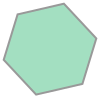

In [266]:
geometry.Polygon(cube.spaxel_vertices)

In [267]:
cube.index_to_xy??

In [278]:
TARGET_REFPOS  = np.asarray([0,0])
SPAXEL_ARCSEC  = 0.75
IMAGE_ARCSEC  = sg.units_to_pixels('arcsec').value
arcsec_centroid_relative_to_sn = (cube.index_to_xy(cube.indexes) - TARGET_REFPOS) * SPAXEL_ARCSEC *IMAGE_ARCSEC

In [279]:
arcsec_centroid_relative_to_sn

array([[ -9.34961144,  40.4976164 ],
       [ 12.1854222 ,  39.8567201 ],
       [ -1.47395514,  40.0707947 ],
       ...,
       [ -5.90961636, -41.77542649],
       [  1.96603995, -42.20224819],
       [ -3.81768108, -42.41499529]])

In [285]:
sg.get_target_aperture??